In [1]:
import pandas as pd
import matplotlib.pyplot as plt

import seaborn as sns

In [2]:
df = pd.read_csv("metrics.csv") 


print(df.shape)
print(df.columns)
df.sample(2)

(500, 20)
Index(['run_name', 'arc_features', 'arc_encoder_blocks', 'arc_num_params',
       'arc_latent_volume', 'arc_num_conv', 'arc_skip', 'train_swaps',
       'train_loss', 'valid_loss', 'test_loss', 'valid_F1', 'train_F1',
       'test_F1', 'train_Accuracy', 'valid_Accuracy', 'test_Accuracy',
       'train_Accuracy_seq', 'valid_Accuracy_seq', 'test_Accuracy_seq'],
      dtype='object')


,run_name,arc_features,arc_encoder_blocks,arc_num_params,arc_latent_volume,arc_num_conv,arc_skip,train_swaps,train_loss,valid_loss,test_loss,valid_F1,train_F1,test_F1,train_Accuracy,valid_Accuracy,test_Accuracy,train_Accuracy_seq,valid_Accuracy_seq,test_Accuracy_seq
70,nc_2_n4_0_n8_0_skip1_noise0.95,[4],0,140,512.0,2,1,0.95,0.151364,0.135473,0.142222,0.445873,0.308121,0.446504,0.308121,0.445873,0.446504,0.0,0.0,0.0
399,nc_2_n4_0_n8_0_skip0_noise0.4,[4],0,140,512.0,2,0,0.40,0.097790,0.025026,0.026097,0.998036,0.698166,0.998769,0.698166,0.998036,0.998769,0.0,0.0,0.0


In [3]:
df.describe()

,arc_encoder_blocks,arc_num_params,arc_latent_volume,arc_num_conv,arc_skip,train_swaps,train_loss,valid_loss,test_loss,valid_F1,train_F1,test_F1,train_Accuracy,valid_Accuracy,test_Accuracy,train_Accuracy_seq,valid_Accuracy_seq,test_Accuracy_seq
count,500.00000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.0,500.0,500.0
mean,2.19200,712.736000,222.208000,1.672000,0.500000,0.534000,0.123420,0.090734,0.095645,0.658563,0.497863,0.650493,0.497863,0.658563,0.650493,0.0,0.0,0.0
std,1.23863,370.937266,164.399206,0.469955,0.500501,0.297356,0.040096,0.051899,0.054867,0.290613,0.205026,0.297485,0.205026,0.290613,0.297485,0.0,0.0,0.0
min,0.00000,80.000000,64.000000,1.000000,0.000000,0.000000,0.000286,0.000034,0.000027,0.233801,0.302864,0.272713,0.302864,0.233801,0.272713,0.0,0.0,0.0
25%,1.00000,428.000000,64.000000,1.000000,0.000000,0.300000,0.111828,0.037468,0.039785,0.369354,0.333763,0.357282,0.333763,0.369354,0.357282,0.0,0.0,0.0
50%,2.00000,692.000000,128.000000,2.000000,0.500000,0.550000,0.143548,0.114556,0.121004,0.622074,0.407425,0.624191,0.407425,0.622074,0.624191,0.0,0.0,0.0
75%,3.00000,980.000000,256.000000,2.000000,1.000000,0.800000,0.150312,0.137900,0.145490,0.997984,0.625271,0.998683,0.625271,0.997984,0.998683,0.0,0.0,0.0
max,4.00000,1556.000000,512.000000,2.000000,1.000000,1.000000,0.152296,0.142707,0.150054,1.000000,0.999995,1.000000,0.999995,1.000000,1.000000,0.0,0.0,0.0


In [12]:
import plotly.express as px
import pandas as pd 
from plotly.subplots import make_subplots
import plotly.graph_objects as go

hue = "arc_features"
yplot = "train_Accuracy"
xplot = "train_swaps"
extra_info = ["run_name","arc_num_conv", "arc_encoder_blocks", "arc_latent_volume"]


df0 = df.query("arc_skip == 0")
df1 = df.query("arc_skip == 1")

fig0 = px.scatter(df0, x=xplot, y=yplot, color=hue, title="No skip", hover_data=extra_info, labels={"Train Acc", "# Swaps"})
fig1 = px.scatter(df1, x=xplot, y=yplot, color=hue, title="Skip", hover_data=extra_info, labels={"Train Acc", "# Swaps"})

fig0.update_layout(showlegend=False)  # Oculta la leyenda en el primer gráfico
fig = make_subplots(rows=1, cols=2, subplot_titles=["arc_skip == 0", "arc_skip == 1"], shared_yaxes=True)

for trace in fig0.data:
    fig.add_trace(trace, row=1, col=1)

for trace in fig1.data:
    fig.add_trace(trace, row=1, col=2)
fig.update_layout(width=1600, height=800, legend_title="canales", showlegend=True,
                  xaxis={'title':{'text':"# Swaps"}},
                  yaxis={'title':{'text':"Train Accuracy"}},
                  )

fig.show()

In [11]:
import plotly.express as px
import pandas as pd 
from plotly.subplots import make_subplots
import plotly.graph_objects as go

hue = "arc_features"
yplot = "valid_Accuracy"
xplot = "train_swaps"
extra_info = ["run_name","arc_num_conv", "arc_encoder_blocks", "arc_latent_volume"]


df0 = df.query("arc_skip == 0")
df1 = df.query("arc_skip == 1")

fig0 = px.scatter(df0, x=xplot, y=yplot, color=hue, title="No skip", hover_data=extra_info, labels={"Valid Acc", "# Swaps"})
fig1 = px.scatter(df1, x=xplot, y=yplot, color=hue, title="Skip", hover_data=extra_info, labels={"Valid Acc", "# Swaps"})

fig0.update_layout(showlegend=False)  # Oculta la leyenda en el primer gráfico
fig = make_subplots(rows=1, cols=2, subplot_titles=["arc_skip == 0", "arc_skip == 1"], shared_yaxes=True)

for trace in fig0.data:
    fig.add_trace(trace, row=1, col=1)

for trace in fig1.data:
    fig.add_trace(trace, row=1, col=2)
fig.update_layout(width=1600, height=800, legend_title="canales", showlegend=True,
                  xaxis={'title':{'text':"# Swaps"}},
                  yaxis={'title':{'text':"Valid Accuracy"}},
                  )

fig.show()

In [ ]:
import plotly.express as px
import pandas as pd 
from plotly.subplots import make_subplots
import plotly.graph_objects as go

hue = "arc_features"
yplot = "test_Accuracy"
xplot = "train_swaps"
extra_info = ["run_name","arc_num_conv", "arc_encoder_blocks", "arc_latent_volume"]


df0 = df.query("arc_skip == 0")
df1 = df.query("arc_skip == 1")

fig0 = px.scatter(df0, x=xplot, y=yplot, color=hue, title="No skip", hover_data=extra_info, labels={"test Acc", "# Swaps"})
fig1 = px.scatter(df1, x=xplot, y=yplot, color=hue, title="Skip", hover_data=extra_info, labels={"test Acc", "# Swaps"})

fig0.update_layout(showlegend=False)  # Oculta la leyenda en el primer gráfico
fig = make_subplots(rows=1, cols=2, subplot_titles=["arc_skip == 0", "arc_skip == 1"], shared_yaxes=True)

for trace in fig0.data:
    fig.add_trace(trace, row=1, col=1)

for trace in fig1.data:
    fig.add_trace(trace, row=1, col=2)
fig.update_layout(width=1600, height=800, legend_title="canales", showlegend=True,
                  xaxis={'title':{'text':"# Swaps"}},
                  yaxis={'title':{'text':"Test Accuracy"}},
                  )

fig.show()

In [ ]:
import plotly.express as px
import pandas as pd

from plotly.subplots import make_subplots
import plotly.graph_objects as go


hue = "arc_latent_volume"
xplot = "arc_encoder_blocks"
yplot = "test_Accuracy"

extra_info = [
    "run_name",
    "arc_num_params",
    "arc_features",
    "arc_encoder_blocks",
    "arc_latent_volume",
]

df0 = df.query("arc_skip == 0")
df1 = df.query("arc_skip == 1")

fig0 = px.scatter(
    df0, x=xplot, y=yplot, color=hue, title="No skip", hover_data=extra_info
)
fig1 = px.scatter(df1, x=xplot, y=yplot, color=hue, title="Skip", hover_data=extra_info)

fig0.update_layout(showlegend=False)  # Oculta la leyenda en el primer gráfico

fig = make_subplots(rows=1, cols=2, subplot_titles=["arc_skip == 0", "arc_skip == 1"])

for trace in fig0.data:
    fig.add_trace(trace, row=1, col=1)

for trace in fig1.data:
    fig.add_trace(trace, row=1, col=2)

fig.update_layout(width=900, height=500, legend_title="Num Params", showlegend=True)

fig.show()

In [16]:
df

,run_name,arc_features,arc_encoder_blocks,arc_latent_volume,arc_num_params,arc_skip,arc_pool_mode,arc_up_mode,arc_addition,arc_skip.1,...,test_loss,valid_F1,train_F1,test_F1,train_Accuracy,valid_Accuracy,test_Accuracy,train_Accuracy_seq,valid_Accuracy_seq,test_Accuracy_seq
0,model_n4-3-n8-2-p-max-up-upsample-add-cat-skip1,"[4, 4, 4, 4, 8, 8]",5,32.0,2612,1,max,upsample,cat,1,...,0.096407,0.705047,0.690544,0.688703,0.690544,0.705047,0.688703,0.0,0.0,0.0
1,model_n4-3-n8-2-p-max-up-upsample-add-cat-skip0,"[4, 4, 4, 4, 8, 8]",5,32.0,2228,0,max,upsample,cat,0,...,0.151207,0.296298,0.309817,0.273850,0.309817,0.296298,0.273850,0.0,0.0,0.0
2,model_n4-3-n8-2-p-max-up-upsample-add-sum-skip1,"[4, 4, 4, 4, 8, 8]",5,32.0,2348,1,max,upsample,sum,1,...,0.017963,0.987625,0.984790,0.977246,0.984790,0.987625,0.977246,0.0,0.0,0.0
3,model_n4-3-n8-2-p-max-up-upsample-add-sum-skip0,"[4, 4, 4, 4, 8, 8]",5,32.0,2228,0,max,upsample,sum,0,...,0.154410,0.299616,0.309029,0.275007,0.309029,0.299616,0.275007,0.0,0.0,0.0
4,model_n4-3-n8-2-p-max-up-transpose-add-cat-skip1,"[4, 4, 4, 4, 8, 8]",5,32.0,3020,1,max,transpose,cat,1,...,0.047104,0.951594,0.946299,0.948061,0.946299,0.951594,0.948061,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
190,model_n4-0-n8-0-p-avg-up-transpose-add-sum-skip1,[4],0,512.0,140,1,avg,transpose,sum,1,...,0.032805,0.997550,0.997625,0.998793,0.997625,0.997550,0.998793,0.0,0.0,0.0
191,model_n4-0-n8-0-p-avg-up-transpose-add-sum-skip0,[4],0,512.0,140,0,avg,transpose,sum,0,...,0.032805,0.997550,0.997625,0.998793,0.997625,0.997550,0.998793,0.0,0.0,0.0
192,model_n4-0-n8-0-p-avg-uptranspose-addcat-skip0,"[4, 8, 16, 32, 64]",4,512.0,42080,0,avg,transpose,cat,0,...,NaN,0.375179,0.536719,NaN,0.536719,0.375179,NaN,0.0,0.0,NaN
193,model_n4-0-n8-0-p-avg-uptranspose-addsum-skip1,"[4, 8, 16, 32, 64]",4,512.0,42080,1,avg,transpose,sum,1,...,0.050949,0.767482,0.779187,0.758259,0.779187,0.767482,0.758259,0.0,0.0,0.0


<Axes: xlabel='test_Accuracy', ylabel='arc_addition'>

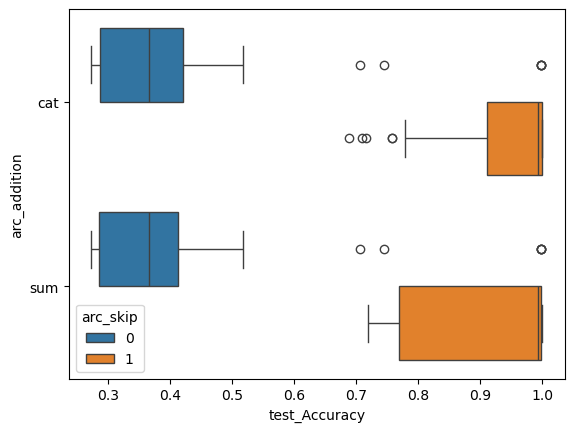

In [25]:
import plotly.express as px
import pandas as pd

from plotly.subplots import make_subplots
import plotly.graph_objects as go


hue = "arc_latent_volume"
xplot = "arc_encoder_blocks"
yplot = "test_Accuracy"

extra_info = [
    "arc_num_params",
    "arc_features",
    "arc_encoder_blocks",
    "arc_latent_volume",
    "arc_skip",
]

sns.boxplot(df, x = 'test_Accuracy',y='arc_addition', hue='arc_skip')

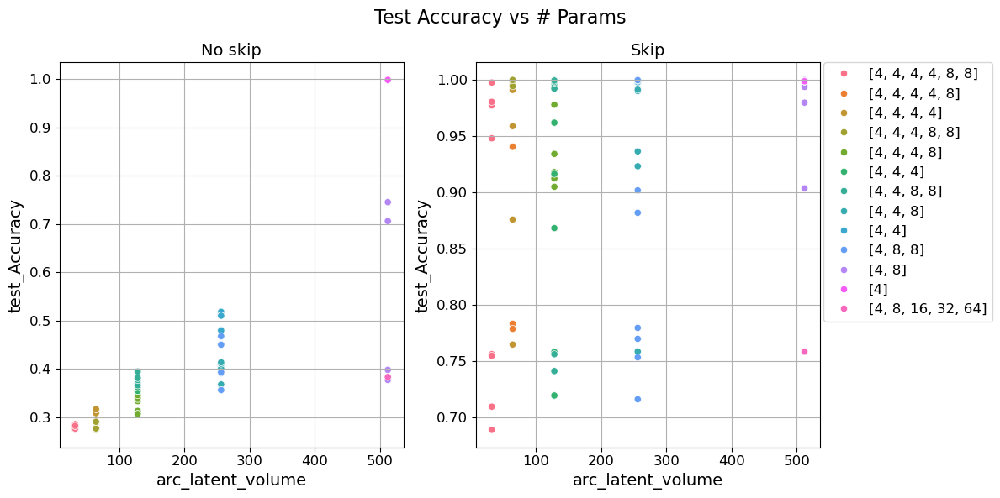

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = plt.subplots(1, 2, figsize=(12, 6))

xplot = "arc_latent_volume"
yplot = "test_Accuracy"
# hue = "arc_latent_volume"
# size = "arc_num_conv"
size = None
hue = "arc_features"
style = None
extra_info = [
    "test_file",
    "arc_num_params",
    "arc_features",
    "arc_encoder_blocks",
    "arc_latent_volume", 
    "arc_skip",
]

df0 = df.query("arc_skip == 0")
df1 = df.query("arc_skip == 1")

sns.scatterplot(
    data=df0, x=xplot, y=yplot, hue=hue, style=style, ax=ax[0], size=size, legend=False
)
sns.scatterplot(data=df1, x=xplot, y=yplot, hue=hue, style=style, size=size, ax=ax[1])

for a in ax:
    a.grid()
    a.set_xlabel(a.get_xlabel(), fontsize=14)
    a.set_ylabel(a.get_ylabel(), fontsize=14)
    a.tick_params(axis="both", which="major", labelsize=12)

ax[1].legend(
    bbox_to_anchor=(1.01, 1),
    loc=2,
    borderaxespad=0.0,
    fontsize=12,
    title_fontsize=14,
)
fig.suptitle("Test Accuracy vs # Params", fontsize=16)
ax[0].set_title("No skip", fontsize=14)
ax[1].set_title("Skip", fontsize=14)

fig.tight_layout()
plt.show()

In [9]:
df.query("arc_latent_volume == 1024.0")

,run_name,arc_features,arc_encoder_blocks,arc_latent_volume,arc_num_params,arc_skip,arc_pool_mode,arc_up_mode,arc_addition,arc_skip.1,...,test_loss,valid_F1,train_F1,test_F1,train_Accuracy,valid_Accuracy,test_Accuracy,train_Accuracy_seq,valid_Accuracy_seq,test_Accuracy_seq


In [ ]:
df.columns

Index(['run_name', 'train_file', 'arc_features', 'arc_num_params',
       'arc_latent_volume', 'arc_skip', 'train_loss', 'valid_loss',
       'test_loss', 'valid_F1', 'train_F1', 'test_F1', 'train_Accuracy',
       'valid_Accuracy', 'test_Accuracy', 'train_Accuracy_seq',
       'valid_Accuracy_seq', 'test_Accuracy_seq'],
      dtype='object')

/tmp/ipykernel_4145248/848854718.py:34: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[1].legend(


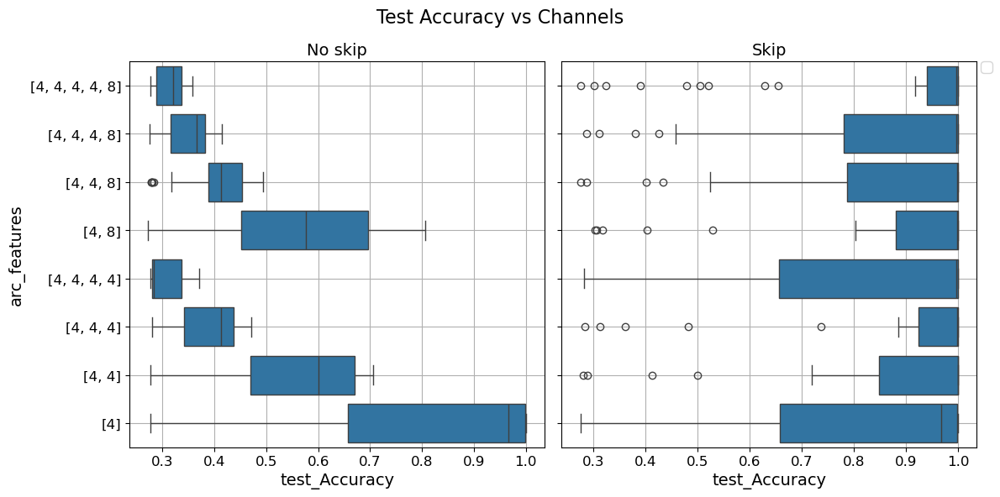

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = plt.subplots(1, 2, figsize=(12, 6), sharey=True)

yplot = "arc_features"
xplot = "test_Accuracy"
# hue = "arc_latent_volume"
# size = "arc_num_conv"
size = None
hue = None
style = None
extra_info = [
    "test_file",
    "arc_num_params",
    "arc_features",
    "arc_encoder_blocks",
    "arc_latent_volume", 
    "arc_skip",
]

df0 = df.query("arc_skip == 0")
df1 = df.query("arc_skip == 1")

sns.boxplot(data=df0, x=xplot, y=yplot, hue=hue, ax=ax[0], legend=False)
sns.boxplot(data=df1, x=xplot, y=yplot, hue=hue, ax=ax[1])

for a in ax:
    a.grid()
    a.set_xlabel(a.get_xlabel(), fontsize=14)
    a.set_ylabel(a.get_ylabel(), fontsize=14)
    a.tick_params(axis="both", which="major", labelsize=12)

ax[1].legend(
    bbox_to_anchor=(1.01, 1),
    loc=2,
    borderaxespad=0.0,
    fontsize=12,
    title_fontsize=14,
)
fig.suptitle("Test Accuracy vs Channels", fontsize=16)
ax[0].set_title("No skip", fontsize=14)
ax[1].set_title("Skip", fontsize=14)

fig.tight_layout()
plt.show()

/tmp/ipykernel_4145248/2661562551.py:40: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[1].legend(
/tmp/ipykernel_4145248/2661562551.py:40: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[1].legend(
/tmp/ipykernel_4145248/2661562551.py:40: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[1].legend(


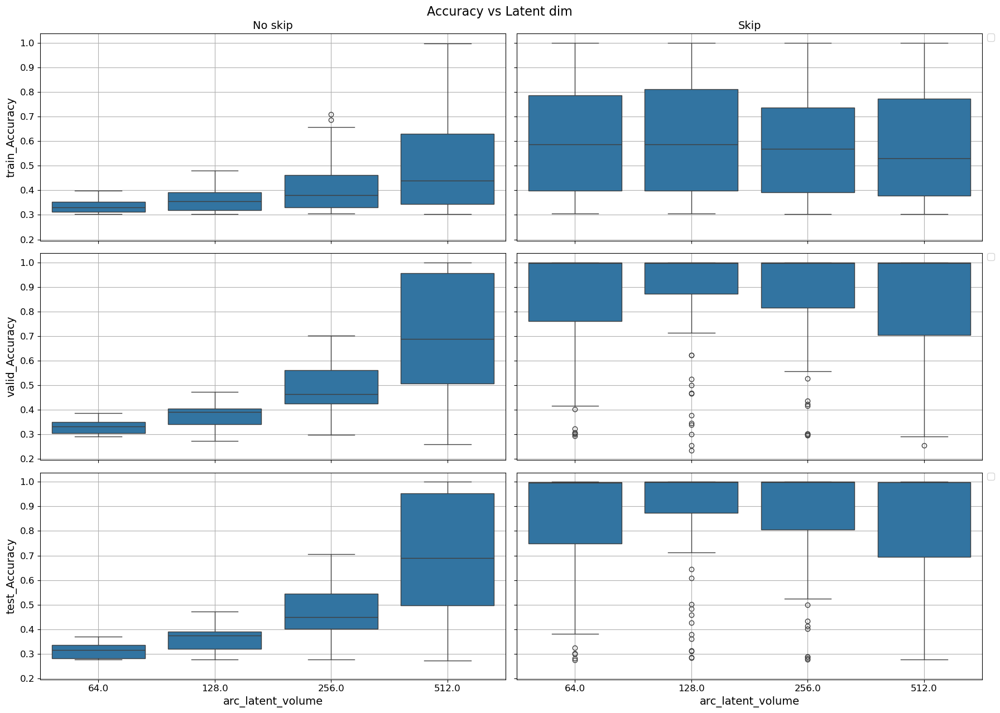

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, axes = plt.subplots(3, 2, figsize=(18, 13), sharey=True, sharex=True)

xplot = "arc_latent_volume"
# hue = "arc_latent_volume"
# size = "arc_num_conv"
size = None
hue = None
style = None
extra_info = [
    "test_file",
    "arc_num_params",
    "arc_features",
    "arc_encoder_blocks",
    "arc_latent_volume", 
    "arc_skip",
]


df0 = df.query("arc_skip == 0")
df1 = df.query("arc_skip == 1")
for i, data in enumerate(['train_Accuracy', 'valid_Accuracy', 'test_Accuracy']):
    
    yplot = data
    ax = [None, None]
    ax[0] = axes[i, 0]
    ax[1] = axes[i, 1]

    sns.boxplot(data=df0, x=xplot, y=yplot, hue=hue, ax=ax[0], legend=False)
    sns.boxplot(data=df1, x=xplot, y=yplot, hue=hue, ax=ax[1])

    for a in ax:
        a.grid()
        a.set_xlabel(a.get_xlabel(), fontsize=14)
        a.set_ylabel(a.get_ylabel(), fontsize=14)
        a.tick_params(axis="both", which="major", labelsize=12)

    ax[1].legend(
        bbox_to_anchor=(1.01, 1),
        loc=2,
        borderaxespad=0.0,
        fontsize=12,
        title_fontsize=14,
    )
    fig.suptitle("Accuracy vs Latent dim", fontsize=16)
    axes[0,0].set_title("No skip", fontsize=14)
    axes[0,1].set_title("Skip", fontsize=14)

fig.tight_layout()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = plt.subplots(3, 2, figsize=(12, 6), sharey=True)

xplot = "arc_latent_volume"
yplot = "test_Accuracy"
size = None
hue = None
style = None
extra_info = [
    "test_file",
    "arc_num_params",
    "arc_features",
    "arc_encoder_blocks",
    "arc_latent_volume", 
    "arc_skip",
]

df0 = df.query("arc_skip == 0")
df1 = df.query("arc_skip == 1")

sns.boxplot(data=df0, x=xplot, y=yplot, hue=hue, ax=ax[0], legend=False)
sns.boxplot(data=df1, x=xplot, y=yplot, hue=hue, ax=ax[1])

for a in ax:
    a.grid()
    a.set_xlabel(a.get_xlabel(), fontsize=14)
    a.set_ylabel(a.get_ylabel(), fontsize=14)
    a.tick_params(axis="both", which="major", labelsize=12)

ax[1].legend(
    bbox_to_anchor=(1.01, 1),
    loc=2,
    borderaxespad=0.0,
    fontsize=12,
    title_fontsize=14,
)
fig.suptitle("Test Accuracy vs Channels", fontsize=16)
ax[0].set_title("No skip", fontsize=14)
ax[1].set_title("Skip", fontsize=14)

fig.tight_layout()
plt.show()

/tmp/ipykernel_2783061/3568832521.py:38: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_2783061/3568832521.py:38: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



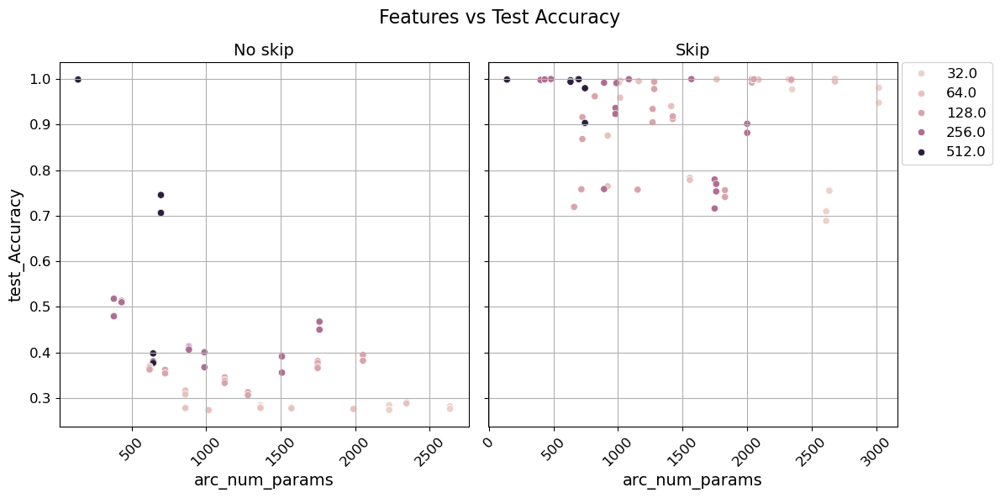

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = plt.subplots(1, 2, figsize=(12, 6), sharey=True)

xplot = "arc_num_params"
yplot = "test_Accuracy"
hue = "arc_latent_volume"
extra_info = [
    "test_file",
    "arc_num_params",
    "arc_features",
    "arc_encoder_blocks",
    "arc_latent_volume",
    "arc_num_conv",
    "arc_skip",
]

df0 = df.query("arc_skip == 0 and arc_num_params < 30000")
df1 = df.query("arc_skip == 1 and arc_num_params < 30000")

sns.scatterplot(
    data=df0.sort_values(by="test_Accuracy", ascending=False),
    x=xplot,
    y=yplot,
    hue=hue,
    ax=ax[0],
    legend=False,
)
sns.scatterplot(data=df1, x=xplot, y=yplot, hue=hue, ax=ax[1])

for a in ax:
    a.grid()
    a.set_xlabel(a.get_xlabel(), fontsize=14)
    a.set_ylabel(a.get_ylabel(), fontsize=14)
    a.tick_params(axis="both", which="major", labelsize=12)
    a.set_xticklabels(a.get_xticklabels(), rotation=45)

ax[1].legend(
    bbox_to_anchor=(1.01, 1),
    loc=2,
    borderaxespad=0.0,
    fontsize=12,
    title_fontsize=14,
)
fig.suptitle("Features vs Test Accuracy", fontsize=16)
ax[0].set_title("No skip", fontsize=14)
ax[1].set_title("Skip", fontsize=14)

fig.tight_layout()
plt.show()

/tmp/ipykernel_3360969/4051964420.py:36: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  a.set_xticklabels(a.get_xticklabels(), rotation=90)
/tmp/ipykernel_3360969/4051964420.py:36: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  a.set_xticklabels(a.get_xticklabels(), rotation=90)


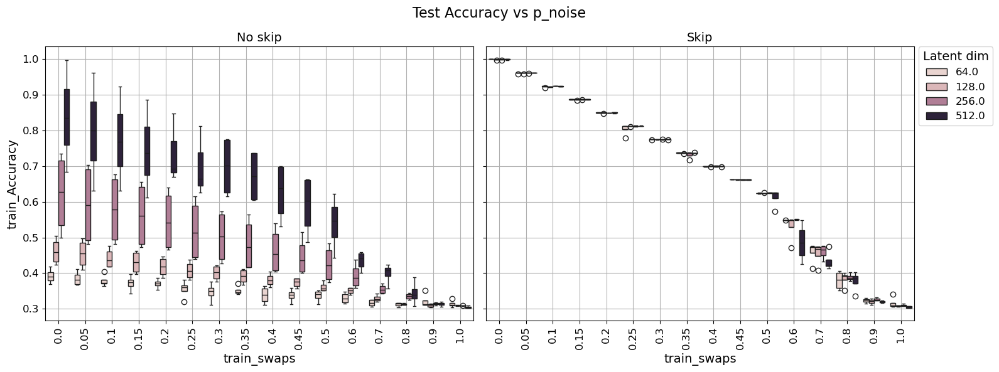

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

xplot = "train_swaps"
yplot = "train_Accuracy"
hue = 'arc_latent_volume'
extra_info = [
    "test_file",
    "arc_num_params",
    "arc_features",
    "arc_encoder_blocks",
    "arc_latent_volume",
    "arc_skip",
]

df0 = df.query("arc_skip == 0")
df1 = df.query("arc_skip == 1")

sns.boxplot(
    data=df0.sort_values(by="train_Accuracy"),
    x=xplot,
    y=yplot,
    hue=hue,
    ax=ax[0],
    legend=False,
)
sns.boxplot(data=df1, x=xplot, y=yplot, hue=hue, ax=ax[1])

for a in ax:
    a.grid()
    a.set_xlabel(a.get_xlabel(), fontsize=14)
    a.set_ylabel(a.get_ylabel(), fontsize=14)
    a.tick_params(axis="both", which="major", labelsize=12)
    a.set_xticklabels(a.get_xticklabels(), rotation=90)

ax[1].legend(
    title='Latent dim',
    bbox_to_anchor=(1.01, 1),
    loc=2,
    borderaxespad=0.0,
    fontsize=12,
    title_fontsize=14,
)
fig.suptitle("Test Accuracy vs p_noise", fontsize=16)
ax[0].set_title("No skip", fontsize=14)
ax[1].set_title("Skip", fontsize=14)

fig.tight_layout()
plt.show()

/tmp/ipykernel_3360969/1374213159.py:36: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  a.set_xticklabels(a.get_xticklabels(), rotation=90)
/tmp/ipykernel_3360969/1374213159.py:36: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  a.set_xticklabels(a.get_xticklabels(), rotation=90)


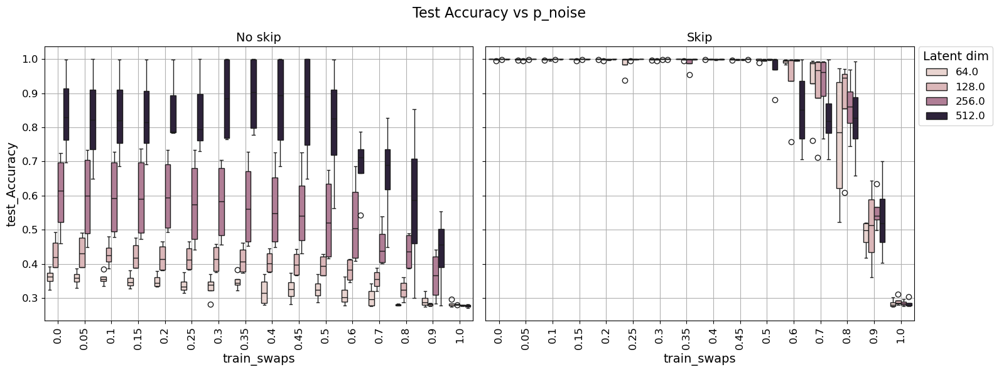

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = plt.subplots(1, 2, figsize=(16, 6), sharey=True, sharex=True)

xplot = "train_swaps"
yplot = "test_Accuracy"
hue = 'arc_latent_volume'
df0 = df.query("arc_skip == 0")
df1 = df.query("arc_skip == 1")

sns.boxplot(
    data=df0.sort_values(by="test_Accuracy"),
    x=xplot,
    y=yplot,
    hue=hue,
    ax=ax[0],
    legend=False,
)
sns.boxplot(data=df1, x=xplot, y=yplot, hue=hue, ax=ax[1])

for a in ax:
    a.grid()
    a.set_xlabel(a.get_xlabel(), fontsize=14)
    a.set_ylabel(a.get_ylabel(), fontsize=14)
    a.tick_params(axis="both", which="major", labelsize=12)
    a.set_xticklabels(a.get_xticklabels(), rotation=90)

ax[1].legend(
    title='Latent dim',
    bbox_to_anchor=(1.01, 1),
    loc=2,
    borderaxespad=0.0,
    fontsize=12,
    title_fontsize=14,
)
fig.suptitle("Test Accuracy vs p_noise", fontsize=16)
ax[0].set_title("No skip", fontsize=14)
ax[1].set_title("Skip", fontsize=14)

fig.tight_layout()
plt.show()

In [43]:
lista = [i * 0.05 for i in range(20)] 

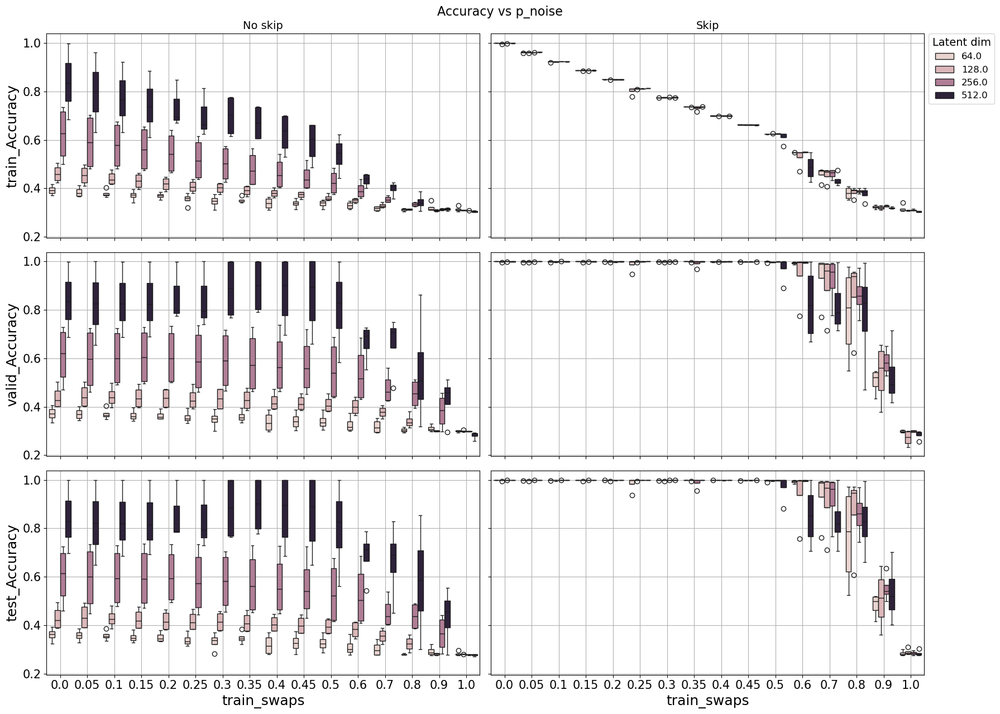

In [54]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, axes = plt.subplots(3, 2, figsize=(18, 13), sharex=True, sharey=True)
df["train_swaps"] = df["train_swaps"].astype(float)
order = sorted(df["train_swaps"].unique())

xplot = "train_swaps"
hue = 'arc_latent_volume'
extra_info = [
    "test_file",
    "arc_num_params",
    "arc_features",
    "arc_encoder_blocks",
    "arc_latent_volume",
    "arc_skip",
]

df0 = df.query("arc_skip == 0")
df1 = df.query("arc_skip == 1")

for i, data in enumerate(['train_Accuracy', 'valid_Accuracy', 'test_Accuracy']):

    yplot = data
    ax = [None, None]
    ax[0] = axes[i, 0]
    ax[1] = axes[i, 1]
    sns.boxplot(
        data=df0.sort_values(by=data),
        x=xplot,
        y=yplot,
        hue=hue,
        ax=ax[0],
        legend=False,
    )
    legend = True
    if i != 0:
        legend = False
    sns.boxplot(data=df1, x=xplot, y=yplot, hue=hue, ax=ax[1], legend=legend)
    
    for a in ax:
        a.grid()
        a.set_xlabel(a.get_xlabel(), fontsize=18)
        a.set_ylabel(a.get_ylabel(), fontsize=18)
        a.tick_params(axis="both", which="major", labelsize=15)
        
        

axes[0,1].legend(
    title='Latent dim',
    bbox_to_anchor=(1.01, 1),
    loc=2,
    borderaxespad=0.0,
    fontsize=12,
    title_fontsize=14,
)
    
axes[0,0].set_title("No skip", fontsize=14)
axes[0,1].set_title("Skip", fontsize=14)
fig.suptitle("Accuracy vs p_noise", fontsize=16)

fig.tight_layout()
plt.show()

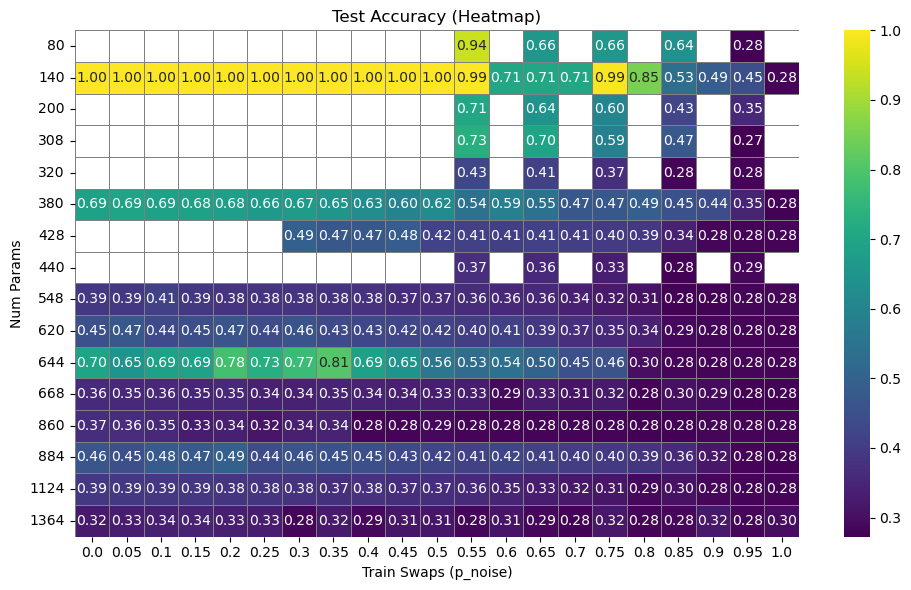

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Asegurate de que los ejes X e Y estén en el tipo correcto
df["train_swaps"] = df["train_swaps"].astype(float)
df["arc_num_params"] = df["arc_num_params"].astype(int)

# Agrupamos por combinación (X, Y) y sacamos el promedio del Z
heatmap_data = df[df['arc_skip']==0].groupby(['arc_num_params', 'train_swaps'])['test_Accuracy'].mean().reset_index()

# Creamos la matriz para el heatmap
pivot_table = heatmap_data.pivot(index='arc_num_params', columns='train_swaps', values='test_Accuracy')

# Ordenamos las columnas por valor (opcional)
pivot_table = pivot_table.sort_index(axis=1)

# Mapa de calor
plt.figure(figsize=(10, 6))
sns.heatmap(
    pivot_table,
    cmap="viridis",  # o "coolwarm", "magma", etc.
    annot=True,      # muestra los valores
    fmt=".2f",       # formato de los valores
    linewidths=0.5,
    linecolor='gray'
)

plt.title("Test Accuracy (Heatmap)")
plt.xlabel("Train Swaps (p_noise)")
plt.ylabel("Num Params")
plt.tight_layout()
plt.show()


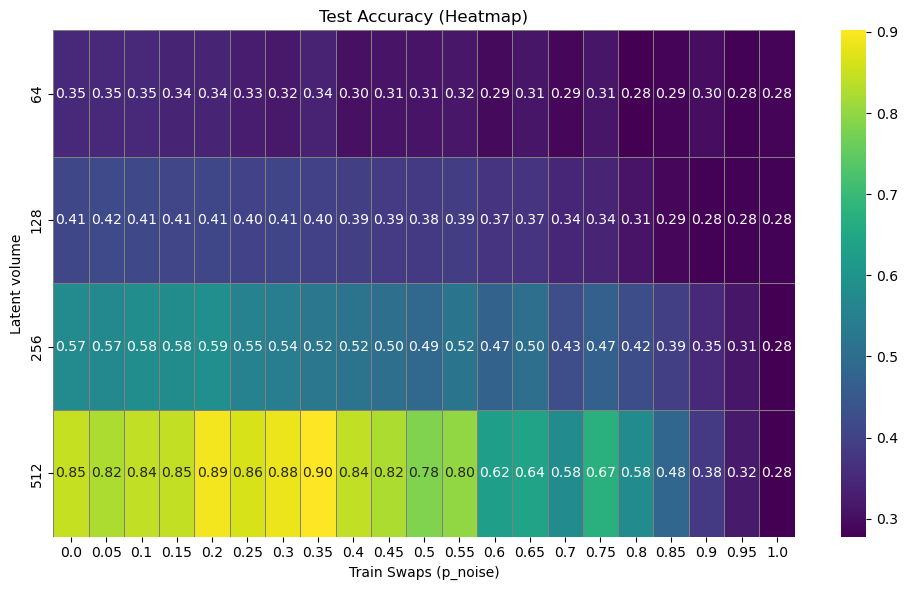

In [13]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Asegurate de que los ejes X e Y estén en el tipo correcto
df["train_swaps"] = df["train_swaps"].astype(float)
df["arc_latent_volume"] = df["arc_latent_volume"].astype(int)

# Agrupamos por combinación (X, Y) y sacamos el promedio del Z
heatmap_data = df[df['arc_skip']==0].groupby(['arc_latent_volume', 'train_swaps'])['test_Accuracy'].mean().reset_index()

# Creamos la matriz para el heatmap
pivot_table = heatmap_data.pivot(index='arc_latent_volume', columns='train_swaps', values='test_Accuracy')

# Ordenamos las columnas por valor (opcional)
pivot_table = pivot_table.sort_index(axis=1)

# Mapa de calor
plt.figure(figsize=(10, 6))
sns.heatmap(
    pivot_table,
    cmap="viridis",  # o "coolwarm", "magma", etc.
    annot=True,      # muestra los valores
    fmt=".2f",       # formato de los valores
    linewidths=0.5,
    linecolor='gray'
)

plt.title("Test Accuracy (Heatmap)")
plt.xlabel("Train Swaps (p_noise)")
plt.ylabel("Latent volume")
plt.tight_layout()
plt.show()

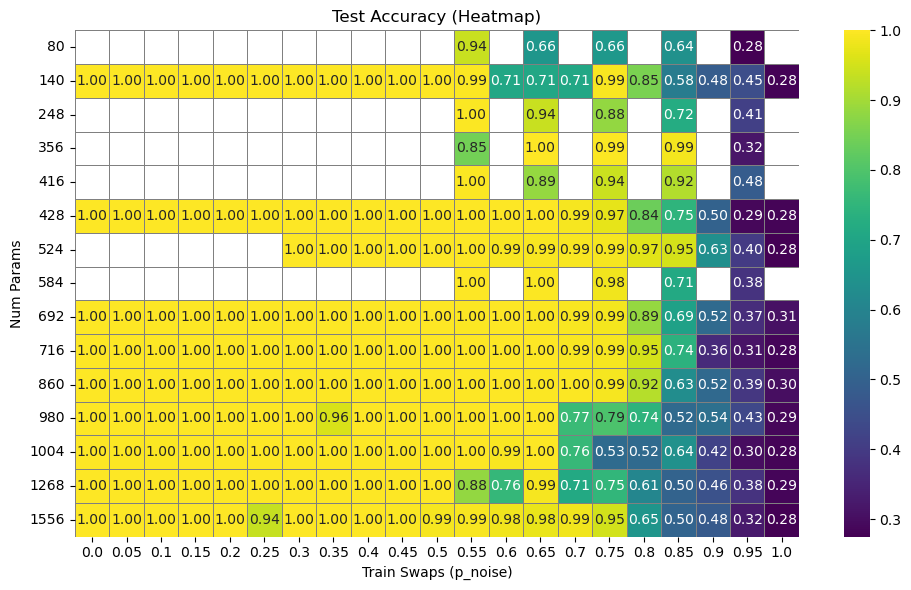

In [14]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Asegurate de que los ejes X e Y estén en el tipo correcto
df["train_swaps"] = df["train_swaps"].astype(float)
df["arc_num_params"] = df["arc_num_params"].astype(int)

# Agrupamos por combinación (X, Y) y sacamos el promedio del Z
heatmap_data = df[df['arc_skip']==1].groupby(['arc_num_params', 'train_swaps'])['test_Accuracy'].mean().reset_index()

# Creamos la matriz para el heatmap
pivot_table = heatmap_data.pivot(index='arc_num_params', columns='train_swaps', values='test_Accuracy')

# Ordenamos las columnas por valor (opcional)
pivot_table = pivot_table.sort_index(axis=1)

# Mapa de calor
plt.figure(figsize=(10, 6))
sns.heatmap(
    pivot_table,
    cmap="viridis",  # o "coolwarm", "magma", etc.
    annot=True,      # muestra los valores
    fmt=".2f",       # formato de los valores
    linewidths=0.5,
    linecolor='gray'
)

plt.title("Test Accuracy (Heatmap)")
plt.xlabel("Train Swaps (p_noise)")
plt.ylabel("Num Params")
plt.tight_layout()
plt.show()


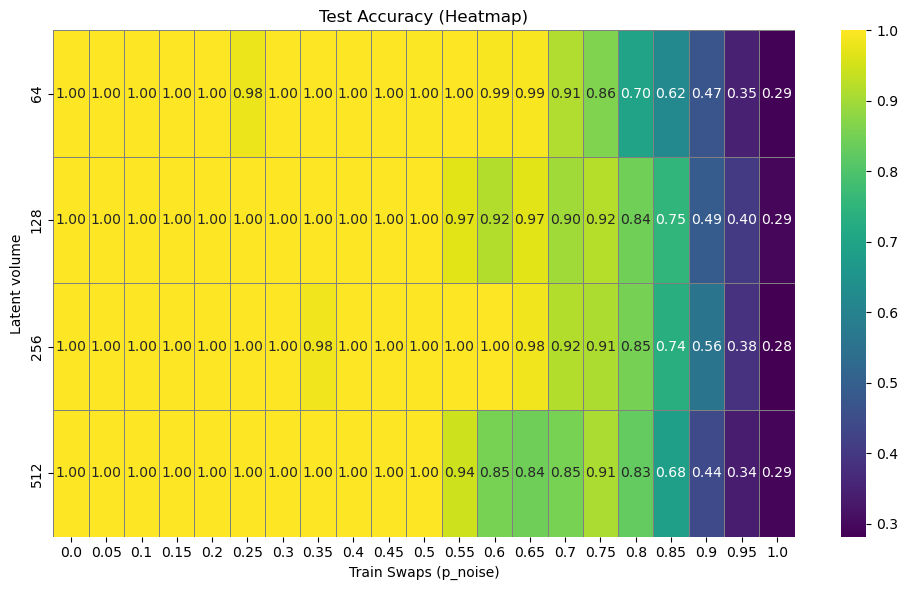

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Asegurate de que los ejes X e Y estén en el tipo correcto
df["train_swaps"] = df["train_swaps"].astype(float)
df["arc_latent_volume"] = df["arc_latent_volume"].astype(int)

# Agrupamos por combinación (X, Y) y sacamos el promedio del Z
heatmap_data = df[df['arc_skip']==1].groupby(['arc_latent_volume', 'train_swaps'])['test_Accuracy'].mean().reset_index()

# Creamos la matriz para el heatmap
pivot_table = heatmap_data.pivot(index='arc_latent_volume', columns='train_swaps', values='test_Accuracy')

# Ordenamos las columnas por valor (opcional)
pivot_table = pivot_table.sort_index(axis=1)

# Mapa de calor
plt.figure(figsize=(10, 6))
sns.heatmap(
    pivot_table,
    cmap="viridis",  # o "coolwarm", "magma", etc.
    annot=True,      # muestra los valores
    fmt=".2f",       # formato de los valores
    linewidths=0.5,
    linecolor='gray'
)

plt.title("Test Accuracy (Heatmap)")
plt.xlabel("Train Swaps (p_noise)")
plt.ylabel("Latent volume")
plt.tight_layout()
plt.show()

In [16]:
df.query('arc_num_params == 380')

,run_name,arc_features,arc_encoder_blocks,arc_num_params,arc_latent_volume,arc_num_conv,arc_skip,train_swaps,train_loss,valid_loss,test_loss,valid_F1,train_F1,test_F1,train_Accuracy,valid_Accuracy,test_Accuracy,train_Accuracy_seq,valid_Accuracy_seq,test_Accuracy_seq
61,nc_2_n4_1_n8_0_skip0_noise0.95,"[4, 4]",1,380,256,2,0,0.95,0.151752,0.139448,0.147177,0.368937,0.306742,0.346021,0.306742,0.368937,0.346021,0.0,0.0,0.0
63,nc_2_n4_1_n8_0_skip0_noise0.85,"[4, 4]",1,380,256,2,0,0.85,0.150879,0.133794,0.140617,0.475225,0.328185,0.453129,0.328185,0.475225,0.453129,0.0,0.0,0.0
65,nc_2_n4_1_n8_0_skip0_noise0.75,"[4, 4]",1,380,256,2,0,0.75,0.149259,0.126510,0.133607,0.494226,0.350732,0.469582,0.350732,0.494226,0.469582,0.0,0.0,0.0
67,nc_2_n4_1_n8_0_skip0_noise0.65,"[4, 4]",1,380,256,2,0,0.65,0.145645,0.114726,0.121177,0.560585,0.386512,0.545061,0.386512,0.560585,0.545061,0.0,0.0,0.0
69,nc_2_n4_1_n8_0_skip0_noise0.55,"[4, 4]",1,380,256,2,0,0.55,0.141682,0.109856,0.115656,0.561968,0.414134,0.543323,0.414134,0.561968,0.543323,0.0,0.0,0.0
353,nc_2_n4_1_n8_0_skip0_noise1,"[4, 4]",1,380,256,2,0,1.00,0.151718,0.141576,0.149495,0.298280,0.307987,0.276335,0.307987,0.298280,0.276335,0.0,0.0,0.0
355,nc_2_n4_1_n8_0_skip0_noise0.9,"[4, 4]",1,380,256,2,0,0.90,0.151494,0.137102,0.144698,0.457379,0.315704,0.441063,0.315704,0.457379,0.441063,0.0,0.0,0.0
357,nc_2_n4_1_n8_0_skip0_noise0.8,"[4, 4]",1,380,256,2,0,0.80,0.150227,0.129399,0.136717,0.512125,0.344351,0.489996,0.344351,0.512125,0.489996,0.0,0.0,0.0
359,nc_2_n4_1_n8_0_skip0_noise0.7,"[4, 4]",1,380,256,2,0,0.70,0.148147,0.122940,0.129663,0.496430,0.361566,0.469537,0.361566,0.496430,0.469537,0.0,0.0,0.0
361,nc_2_n4_1_n8_0_skip0_noise0.6,"[4, 4]",1,380,256,2,0,0.60,0.143549,0.111517,0.117422,0.589942,0.404240,0.585787,0.404240,0.589942,0.585787,0.0,0.0,0.0


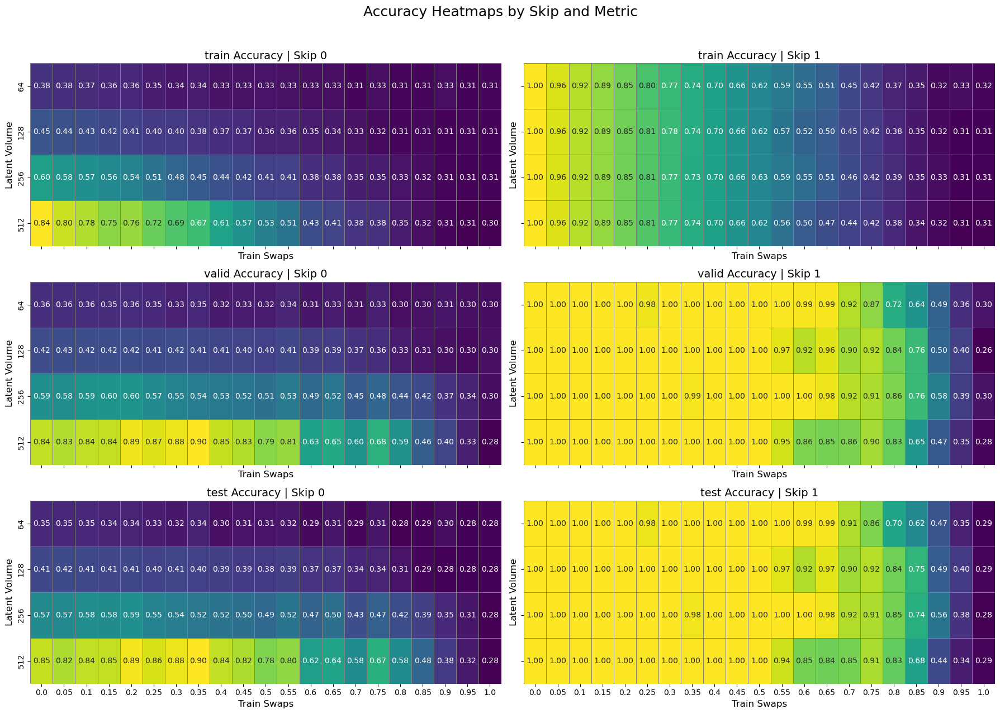

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Asegurate de que los tipos de datos estén correctos
df["train_swaps"] = df["train_swaps"].astype(float)
df["arc_latent_volume"] = df["arc_latent_volume"].astype(int)

# Métricas a graficar y valores de arc_skip
metrics = ['train_Accuracy', 'valid_Accuracy', 'test_Accuracy']
skip_values = [0, 1]

# Crear figura con 3 filas (train, valid, test) y 2 columnas (skip 0 y skip 1)
fig, axes = plt.subplots(3, 2, figsize=(18, 13), sharex=True, sharey=True)

for i, metric in enumerate(metrics):
    for j, skip in enumerate(skip_values):
        ax = axes[i, j]
        
        # Filtrar y agrupar
        heatmap_data = df[df['arc_skip'] == skip].groupby(
            ['arc_latent_volume', 'train_swaps']
        )[metric].mean().reset_index()

        # Crear matriz para heatmap
        pivot_table = heatmap_data.pivot(
            index='arc_latent_volume', columns='train_swaps', values=metric
        ).sort_index(axis=1)

        # Graficar heatmap
        sns.heatmap(
            pivot_table,
            cmap="viridis",
            annot=True,
            fmt=".2f",
            linewidths=0.5,
            linecolor='gray',
            ax=ax,
            cbar=False  # Solo mostrar la barra de color una vez
        )

        ax.set_title(f"{metric.replace('_', ' ')} | Skip {skip}", fontsize=14)
        ax.set_xlabel("Train Swaps", fontsize=12)
        ax.set_ylabel("Latent Volume", fontsize=12)

plt.suptitle("Accuracy Heatmaps: Skip and Metric", fontsize=18)
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Deja espacio para el título general
plt.show()


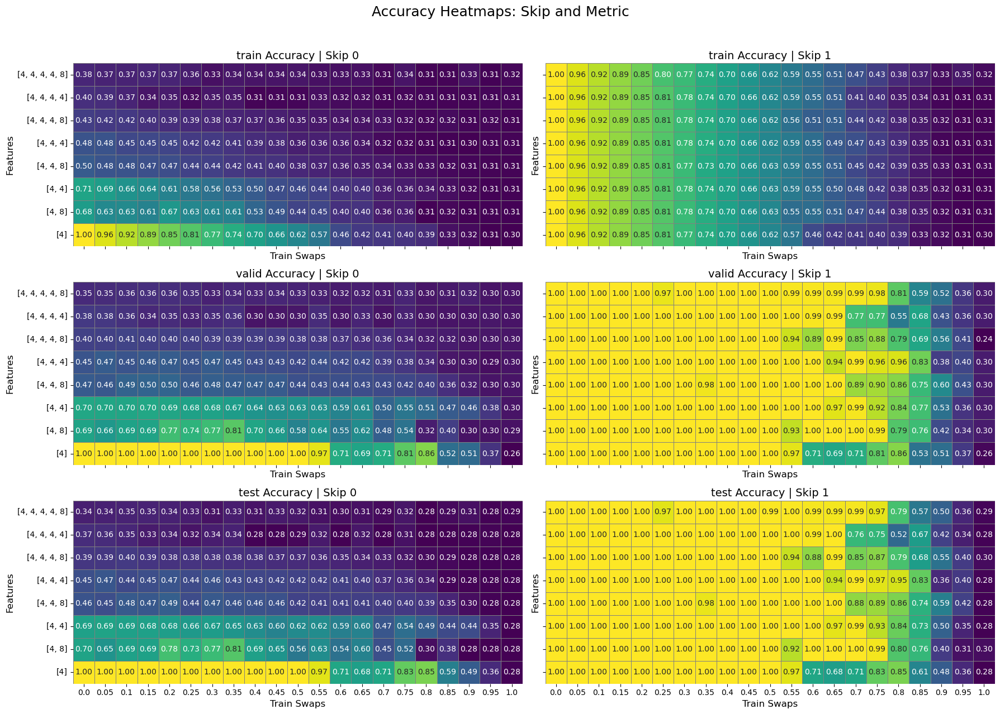

In [24]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Asegurate de que los tipos de datos estén correctos
df["train_swaps"] = df["train_swaps"].astype(float) 

# Métricas a graficar y valores de arc_skip
metrics = ['train_Accuracy', 'valid_Accuracy', 'test_Accuracy']
skip_values = [0, 1]

# Crear figura con 3 filas (train, valid, test) y 2 columnas (skip 0 y skip 1)
fig, axes = plt.subplots(3, 2, figsize=(18, 13), sharex=True, sharey=True)

for i, metric in enumerate(metrics):
    for j, skip in enumerate(skip_values):
        ax = axes[i, j]
        
        # Filtrar y agrupar
        heatmap_data = df[df['arc_skip'] == skip].groupby(
            ['arc_features', 'train_swaps']
        )[metric].mean().reset_index()

        # Crear matriz para heatmap
        pivot_table = heatmap_data.pivot(
            index='arc_features', columns='train_swaps', values=metric
        ).sort_index(axis=1)

        # Graficar heatmap
        sns.heatmap(
            pivot_table,
            cmap="viridis",
            annot=True,
            fmt=".2f",
            linewidths=0.5,
            linecolor='gray',
            ax=ax,
            cbar=False  # Solo mostrar la barra de color una vez
        )

        ax.set_title(f"{metric.replace('_', ' ')} | Skip {skip}", fontsize=14)
        ax.set_xlabel("Train Swaps", fontsize=12)
        ax.set_ylabel("Features", fontsize=12)

plt.suptitle("Accuracy Heatmaps: Skip and Metric", fontsize=18)
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Deja espacio para el título general
plt.show()


In [21]:
df.query('arc_num_params in [80, 248, 356, 416, 528, 584]')['arc_features'].unique()

array(['[4, 8]', '[4, 4, 4, 4]', '[4, 4, 4]', '[4, 4]', '[4]'],
      dtype=object)